In [1]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
import keras
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder



In [2]:
train = pd.read_csv("Teleplay.csv", delimiter=",")
train["members"].fillna(0, inplace=True)
train["type"].fillna("medium", inplace=True)

In [3]:
train.head()

,teleplay_id,name,genre,type,episodes,rating,members
0,32281,Kimi no Na wa.,"Drama, Romance, School, Supernatural",long,1,9.37,200630
1,28977,Gintama°,"Action, Comedy, Historical, Parody, Samurai, S...",medium,51,9.25,114262
2,9253,Steins;Gate,"Sci-Fi, Thriller",medium,24,9.17,673572
3,9969,Gintama&#039;,"Action, Comedy, Historical, Parody, Samurai, S...",medium,51,9.16,151266
4,32935,Haikyuu!!: Karasuno Koukou VS Shiratorizawa Ga...,"Comedy, Drama, School, Shounen, Sports",medium,10,9.15,93351


In [4]:
train.describe()


,teleplay_id,rating,members
count,10204.000000,10011.000000,1.020400e+04
mean,14081.318993,6.474365,1.807675e+04
std,11432.169194,1.026867,5.458373e+04
min,1.000000,1.670000,5.000000e+00
25%,3541.750000,5.880000,2.247500e+02
50%,10283.500000,6.570000,1.523500e+03
75%,24786.000000,7.180000,9.360250e+03
max,34527.000000,9.600000,1.013917e+06


In [5]:


def tokenize(input_str: str = None) -> list:
    try:
        assert isinstance(input_str, str)
    except AssertionError as e:
        return list()

    return [word.strip() for word in input_str.split(",")]


def get_all_genre() -> list:
    genre = train["genre"]
    all_genre = set()
    for line in genre:
        for item in tokenize(line):
            all_genre.add(item)
    # Python set does not guarantee order, so convert to list
    return list(all_genre)


all_genre = get_all_genre()
all_type = np.unique(train["type"]).tolist()


In [6]:


def encode_genre(arr: list, all_genre: list) -> list:
    """
        encode genre to a vector, like "multi-hot encoder"
    """
    encoded = np.zeros_like(all_genre, dtype=np.int64)
    for genre in arr:
        encoded[all_genre.index(genre)] = 1
    return encoded


def encode_type(arr: list, all_type: list) -> list:
    encoded = [all_type.index(t) for t in arr]
    return encoded



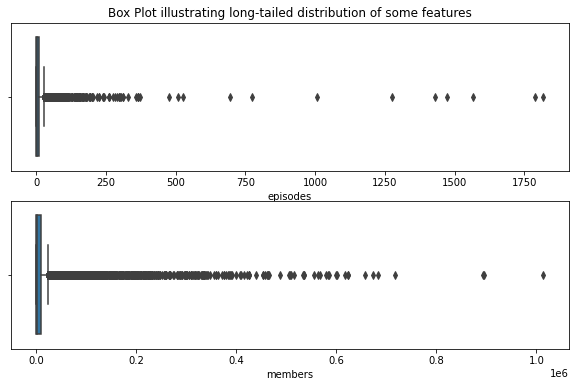

In [7]:
encoded_genre = pd.DataFrame(
    np.array([encode_genre(tokenize(genre), all_genre) for genre in train["genre"]], dtype=np.int64), columns=all_genre, dtype=np.int64)
encoded_type = pd.DataFrame(
    np.array(encode_type(train["type"], all_type), dtype=np.int64), columns=["type"])

train = train.drop(["genre", "type", "name"], axis=1)
train.loc[train["episodes"] == "Unknown", "episodes"] = 0.0

train = train.astype("float")

train = pd.concat([train, encoded_type], axis=1)
train = pd.concat([train, encoded_genre], axis=1)
train.dropna(axis=0, how="any", inplace=True)

# boxplot before capping
plt.rc("figure", figsize=(10, 6))
fig, axes = plt.subplots(2, 1)
sns.boxplot(data=train, x="episodes", ax=axes[0])
sns.boxplot(data=train, x="members", ax=axes[1])
axes[0].set_title(
    "Box Plot illustrating long-tailed distribution of some features")
plt.show()

#!! baselines

In [8]:
model_result = []  # RMSE of models

train = train.astype("float")
train_Y = train["rating"]
train_X = train.drop(["rating", "teleplay_id"], axis=1)

In [9]:
rf = RandomForestRegressor(random_state=4434)
train_X, val_X, train_Y, val_Y = train_test_split(
    train_X, train_Y, test_size=0.2)
rf.fit(train_X, train_Y)
mean_squared_error(val_Y, rf.predict(val_X))
result = np.sqrt(cross_val_score(rf, train_X, train_Y,
                                 scoring=make_scorer(mean_squared_error), cv=5))
print("avg RMSE: %.4f" % result.mean())
model_result.append(result.mean())

avg RMSE: 0.6785


C:\Users\11385\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

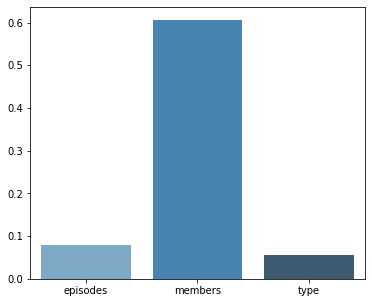

In [10]:
plt.rc("figure", figsize=(6, 5))
importance = rf.feature_importances_
sns.barplot(train_X.columns[:3], importance[:3], palette="Blues_d")

In [11]:
# #!data visualization

C:\Users\11385\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\11385\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\11385\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either 

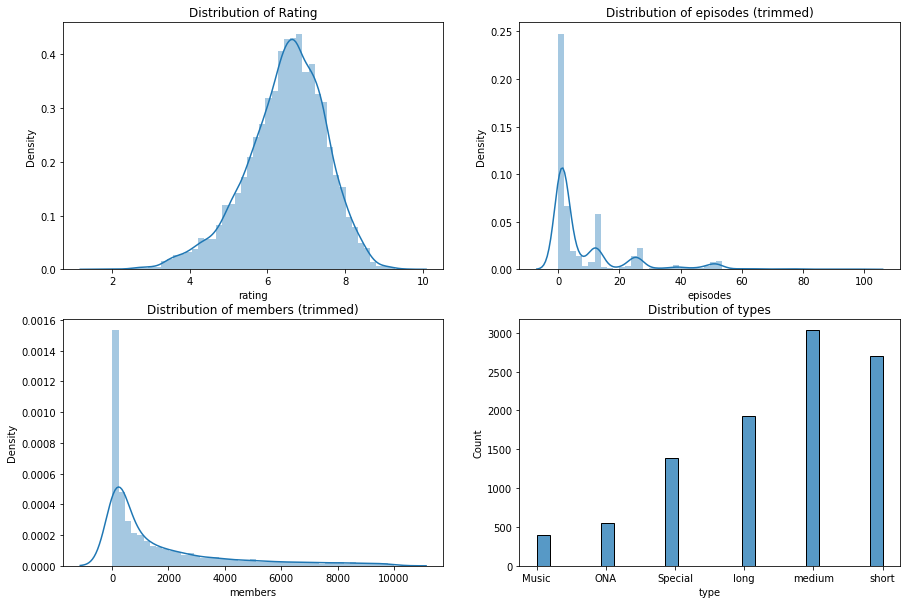

In [12]:
plt.rc("figure", figsize=(15, 10))
fig, axes = plt.subplots(2, 2)
sns.distplot(train["rating"], ax=axes[0][0])
axes[0][0].set_title("Distribution of Rating")
sns.distplot(train[train["episodes"] < 100]["episodes"], ax=axes[0][1])
axes[0][1].set_title("Distribution of episodes (trimmed)")
sns.distplot(train[train["members"] < 1e4]["members"], ax=axes[1][0])
axes[1][0].set_title("Distribution of members (trimmed)")
sns.histplot(train["type"], ax=axes[1][1],)
axes[1][1].set_title("Distribution of types")
axes[1][1].set_xticklabels([""]+all_type)
plt.show()

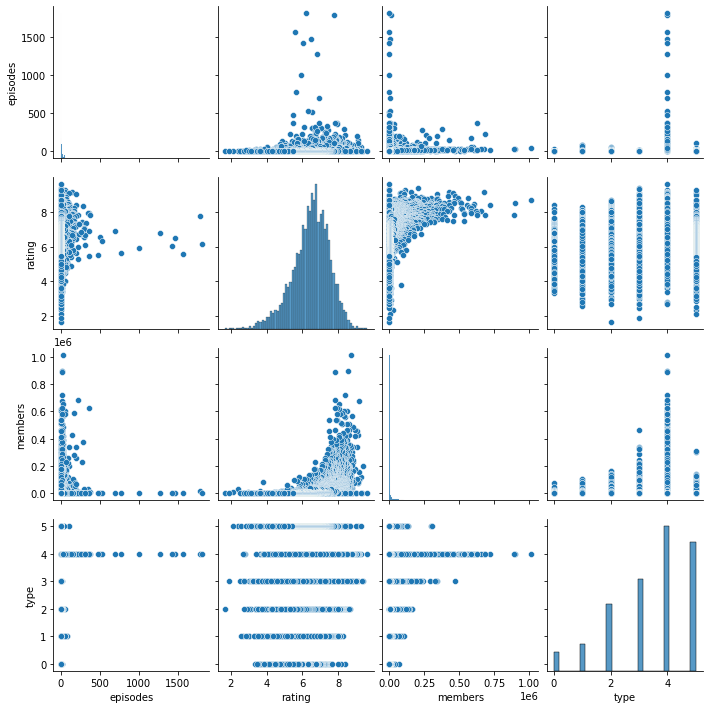

In [13]:
pair_fig = sns.pairplot(train[["episodes", "rating", "members", "type"]])
pair_fig.savefig("pair_plot.png")
plt.rc("figure", figsize=(6, 4))

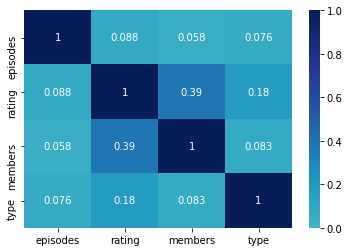

In [14]:
plt.rc("figure", figsize=(6, 4))
corr = sns.heatmap(train[["episodes", "rating", "members", "type"]
                         ].corr(), vmin=0, vmax=1, center=0, cmap="YlGnBu", annot=True)
corr.get_figure().savefig("corr.png")

# capping
train.loc[train["episodes"] > 1000, "episodes"] = 1000
train.loc[train["members"] > 10000, "members"] = 10000

In [15]:
lr = LinearRegression()
result = np.sqrt(cross_val_score(lr, train_X, train_Y,
                                 scoring=make_scorer(mean_squared_error), cv=5))
print("avg RMSE of LR: %.4f" % result.mean())
model_result.append(result.mean())

avg RMSE of LR: 0.8288


In [16]:
expansion = PolynomialFeatures()
poly_train_X = expansion.fit_transform(train_X)
PLR = LinearRegression()
result = np.sqrt(cross_val_score(PLR, poly_train_X, train_Y,
                                 scoring=make_scorer(mean_squared_error), cv=5))
print("avg RMSE of Polynomial LR: %.4f" % result.mean())
model_result.append(result.mean())



avg RMSE of Polynomial LR: 0.9031


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization (BatchNo (None, 46)                184       
_________________________________________________________________
dense (Dense)                (None, 300)               14100     
_________________________________________________________________
batch_normalization_1 (Batch (None, 300)               1200      
_________________________________________________________________
dense_1 (Dense)              (None, 200)               60200     
_________________________________________________________________
batch_normalization_2 (Batch (None, 200)               800       
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 201       
Total params: 76,685
Trainable params: 75,593
Non-trainable params: 1,092
________________________________________________

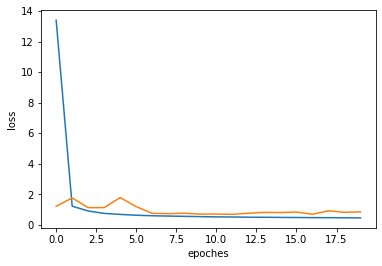

In [17]:
mlp = keras.models.Sequential()
mlp.add(keras.layers.Input([46, ]))
mlp.add(keras.layers.BatchNormalization())
mlp.add(keras.layers.Dense(300, activation="relu"))
mlp.add(keras.layers.BatchNormalization())
mlp.add(keras.layers.Dense(200, activation="relu"))
mlp.add(keras.layers.BatchNormalization())
mlp.add(keras.layers.Dense(1))
mlp.compile(loss=['mse'], metrics=['mse'])
mlp.summary()
es = keras.callbacks.EarlyStopping(patience=8, restore_best_weights=True)
history = mlp.fit(train_X, train_Y, epochs=40,
                  validation_data=(val_X, val_Y), callbacks=[es],)
plt.rc("figure", figsize=(6, 4))
plt.xlabel("epoches")
plt.ylabel("loss")
plt.plot(history.history['mse'])
plt.plot(history.history['val_mse'])
result = np.sqrt(mean_squared_error(train_Y, mlp.predict(train_X)))
model_result.append(result.mean())
# result = cross_val_score(mlp, train_X, train_Y,
#                          scoring=make_scorer(mean_squared_error))

In [18]:
# a magic number 27, I will show the reason in final report.
knr = KNeighborsRegressor(27)
knr.fit(train_X, train_Y)
result = np.sqrt(cross_val_score(knr, train_X, train_Y,
                                 scoring=make_scorer(mean_squared_error), cv=5))
print("avg RMSE of knn: %.4f" % result.mean())
model_result.append(result.mean())


avg RMSE of knn: 0.7483


In [19]:
gbr = GradientBoostingRegressor(random_state=4434)
gbr.fit(train_X, train_Y)
result = np.sqrt(cross_val_score(gbr, train_X, train_Y,
                                 scoring=make_scorer(mean_squared_error), cv=5))
print("avg RMSE of gbr: %.4f" % result.mean())
model_result.append(result.mean())

avg RMSE of gbr: 0.6649


In [20]:
svr = SVR()
svr.fit(train_X, train_Y)
result = np.sqrt(cross_val_score(svr, train_X, train_Y,
                                 scoring=make_scorer(mean_squared_error), cv=5))
print("avg RMSE of svr: %.4f" % result.mean())
model_result.append(result.mean())

avg RMSE of svr: 0.8133


C:\Users\11385\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, '5-fold CV RMSE')

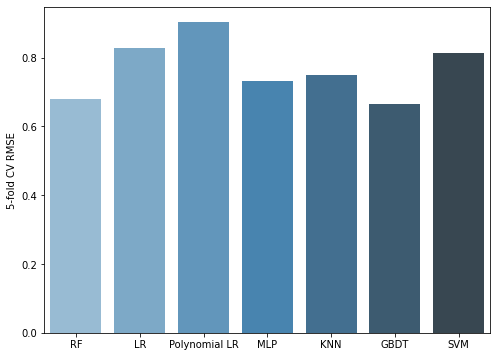

In [21]:
plt.rc("figure", figsize=(8, 6))
sns.barplot(["RF", "LR", "Polynomial LR", "MLP", "KNN", "GBDT", "SVM"],
            model_result, palette="Blues_d")
plt.ylabel("5-fold CV RMSE")

In [22]:
print("training Stacking model may take long time, please wait...")
estimators = [('lr', lr), ('rf', rf), ('knn', knr),
              ('gbdt', gbr), ('svm', svr)]
stacking = StackingRegressor(
    estimators=estimators, final_estimator=LinearRegression())
stacking.fit(train_X, train_Y)
result = np.sqrt(cross_val_score(stacking, train_X, train_Y,
                                 scoring=make_scorer(mean_squared_error), cv=5))
print("avg RMSE of stacking: %.4f" % result.mean())
model_result.append(result.mean())

training Stacking model may take long time, please wait...
avg RMSE of stacking: 0.6511


In [23]:
new_tele = pd.read_csv("New_teleplay.csv", delimiter=",")
new_tele["members"].fillna(0, inplace=True)
new_tele["type"].fillna("medium", inplace=True)
encoded_genre = pd.DataFrame(
    np.array([encode_genre(tokenize(genre), all_genre) for genre in new_tele["genre"]], dtype=np.int64), columns=all_genre, dtype=np.int64)
encoded_type = pd.DataFrame(
    np.array(encode_type(new_tele["type"], all_type), dtype=np.int64), columns=["type"])

new_tele = new_tele.drop(
    ["genre", "type", "name", "rating", "teleplay_id"], axis=1)
new_tele.loc[new_tele["episodes"] == "Unknown", "episodes"] = 0.0
new_tele = new_tele.astype("float")
new_tele = pd.concat([new_tele, encoded_type], axis=1)
new_tele = pd.concat([new_tele, encoded_genre], axis=1)
new_tele.loc[new_tele["episodes"] > 1000, "episodes"] = 1000
new_tele.loc[new_tele["members"] > 10000, "members"] = 10000

In [24]:
prediction = rf.predict(new_tele)
new_tele = pd.read_csv("New_teleplay.csv", delimiter=",")
new_tele["rating"] = prediction
new_tele.to_csv("19079662D_ task1.csv", index=False)
